# Did the box move? — background subtraction + contour detection

**Goal:** detect whether the silver metal box (tray) on the pegboard table has moved
relative to a reference photo, and if so, say **which way to nudge it back**.

**Approach** (per [learnopencv moving-object-detection](https://learnopencv.com/moving-object-detection-with-opencv/)):
background subtraction against an empty-table photo (`assets/table.png`) + contour detection,
then a **gradient edge-snap refinement** so the box outline hugs the real tray edges.

Pipeline stages (each one shows its prediction so we can inspect and iterate):

1. Load + illumination-normalize (the empty-table photo was shot much brighter than the samples)
2. Absolute difference map
3. Percentile threshold + region-of-interest mask (excludes the camera rig on the right)
4. Morphological cleanup (OPEN kills pegboard-dot speckle, CLOSE merges the tray rim into one blob)
5. Largest contour → **coarse** rotated rectangle (inflated ~40 px by the CLOSE + shadows)
6. **Refine**: snap each of the 4 sides to the outermost strong image gradient = the tray rim
7. Compare to reference → moved? + direction instructions
8. **Live feed**: overhead-camera preview with the detection drawn on every frame

Validated on 16 samples across the dataset (tray physically fixed): refined center is stable
to std ≈ 2 px, box size consistent at ~645 × 250 px, regardless of where the black cube sits.

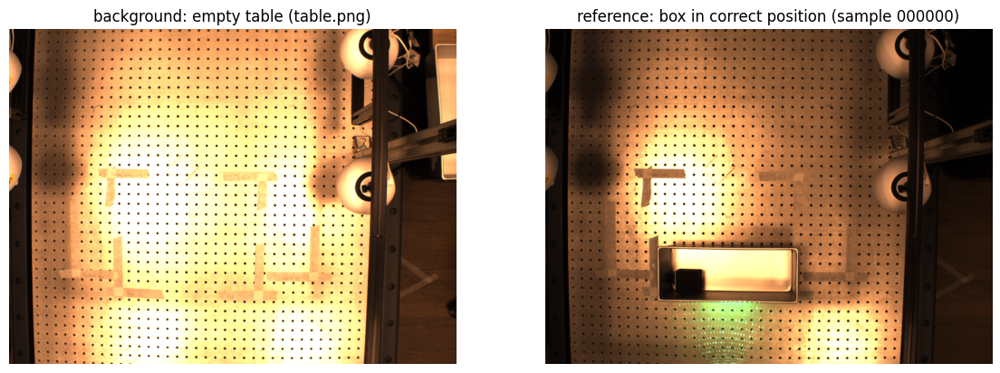

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

BG_PATH  = r"C:\Users\eitanturok\good-vibrations\assets\table.png"          # empty table
REF_PATH = r"D:\eturok\experiment-22\data\samples\000000\outputs\00_raw_overhead.png"  # box in its "correct" spot
SAMPLES  = r"D:\eturok\experiment-22\data\samples"                          # 688 samples

def load_bgr(path):
    return cv2.cvtColor(np.asarray(Image.open(path).convert("RGB")), cv2.COLOR_RGB2BGR)

def show(img, title="", ax=None, cmap=None):
    if ax is None:
        _, ax = plt.subplots(figsize=(7, 5))
    if img.ndim == 3:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    else:
        ax.imshow(img, cmap=cmap or "gray")
    ax.set_title(title); ax.axis("off")
    return ax

BG  = load_bgr(BG_PATH)
ref = load_bgr(REF_PATH)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
show(BG,  "background: empty table (table.png)", axes[0])
show(ref, "reference: box in correct position (sample 000000)", axes[1]);

## Stage 1 — downscale + illumination normalization

The empty-table photo is far brighter than the samples, so raw `absdiff` is dominated by
lighting, not the box. Fix: divide each grayscale image by a heavily blurred copy of
itself. That flattens slow lighting gradients but keeps local structure (box rim, pegboard
dots). Everything runs on a 500-px-wide copy for speed (~15 ms total).

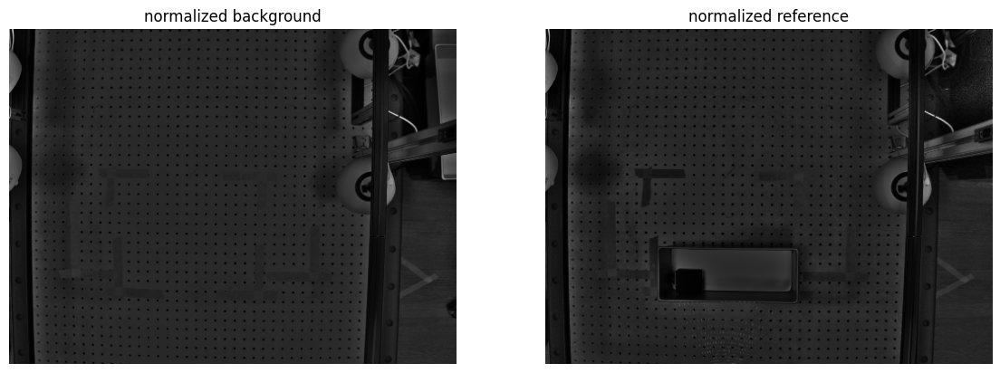

In [2]:
WORK_W = 500

def prep(bgr, work_w=WORK_W):
    '''Downscale + grayscale.'''
    H, W = bgr.shape[:2]
    s = work_w / W
    g = cv2.cvtColor(cv2.resize(bgr, (work_w, int(round(H * s)))), cv2.COLOR_BGR2GRAY)
    return g, s

def illum_norm(gray, sigma=15):
    '''Divide by a heavy blur of itself -> local contrast, lighting removed.'''
    g = gray.astype(np.float32) + 1.0
    return g / cv2.GaussianBlur(g, (0, 0), sigma)

bg_g,  _     = prep(BG)
ref_g, scale = prep(ref)
bg_n,  ref_n = illum_norm(bg_g), illum_norm(ref_g)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
show(bg_n,  "normalized background", axes[0])
show(ref_n, "normalized reference", axes[1]);

## Stage 2 — difference map

`absdiff(normalized sample, normalized background)`, lightly blurred. The tray lights up:
its dark rim replaces bright pegboard, its smooth interior replaces the dot pattern, and
the black cube replaces bright pegboard.

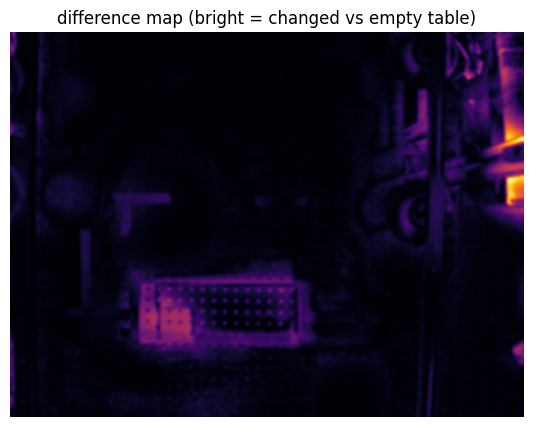

In [3]:
def diff_map(img_n, bg_n):
    d = cv2.absdiff(img_n, bg_n)
    return cv2.GaussianBlur(d, (7, 7), 0)

d = diff_map(ref_n, bg_n)
show(d, "difference map (bright = changed vs empty table)", cmap="inferno");

## Stage 3 — threshold + region of interest

- **ROI**: the right ~28% of the frame is the camera rig (changes between shots for reasons
  unrelated to the box) and the frame edges are dark rails — mask them out.
- **Threshold**: fixed thresholds were fragile and Otsu grabbed everything, so instead keep
  the top 8% brightest diff pixels **within the ROI** (92nd percentile). The tray is by far
  the dominant change, so it survives; pegboard-dot misalignment speckle mostly doesn't.

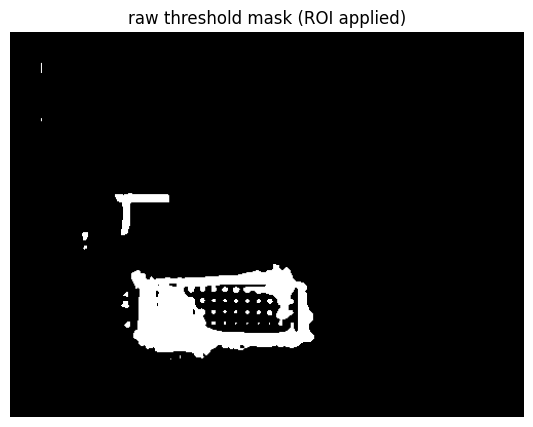

In [4]:
ROI = (0.06, 0.02, 0.72, 0.98)   # x0, y0, x1, y1 as fractions of the frame
PCT = 92.0                        # keep top 8% of diff values inside the ROI

def threshold_roi(d, roi=ROI, pct=PCT):
    h, w = d.shape
    x0, y0, x1, y1 = int(roi[0]*w), int(roi[1]*h), int(roi[2]*w), int(roi[3]*h)
    t = np.percentile(d[y0:y1, x0:x1], pct)
    mask = np.zeros_like(d, np.uint8)
    mask[y0:y1, x0:x1] = (d[y0:y1, x0:x1] > t).astype(np.uint8) * 255
    return mask

raw_mask = threshold_roi(d)
show(raw_mask, "raw threshold mask (ROI applied)");

## Stage 4 — morphological cleanup

- **OPEN (5 px)** erases small speckle from pegboard-dot misalignment.
- **CLOSE (41 px)** merges the tray's rim/interior/cube fragments into one solid blob.
  41 px is deliberately large: the rim is a hollow ring in the mask and we want one filled
  rectangle. (This inflation is exactly why Stage 6 refinement exists.)

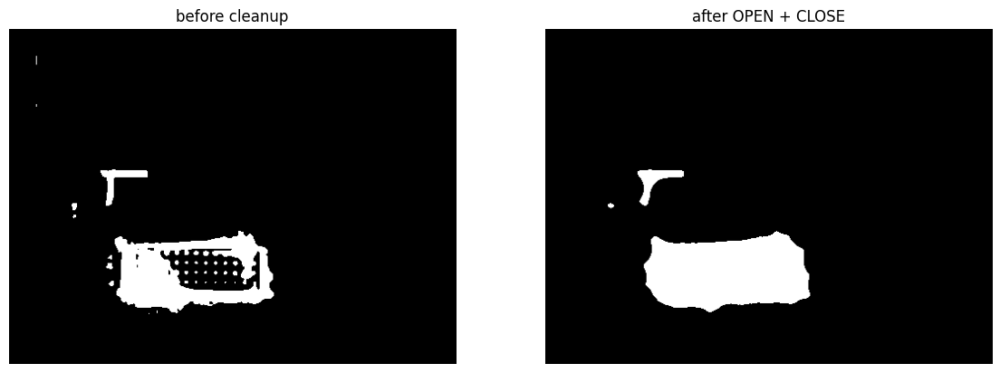

In [5]:
OPEN_PX, CLOSE_PX = 5, 41

def clean_mask(mask, open_px=OPEN_PX, close_px=CLOSE_PX):
    k = cv2.getStructuringElement
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  k(cv2.MORPH_ELLIPSE, (open_px, open_px)))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k(cv2.MORPH_ELLIPSE, (close_px, close_px)))
    return mask

mask = clean_mask(raw_mask)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
show(raw_mask, "before cleanup", axes[0])
show(mask, "after OPEN + CLOSE", axes[1]);

## Stage 5 — contour → coarse rotated rectangle

Largest external contour of the cleaned mask, fit with `cv2.minAreaRect`, scaled back to
full resolution. This localizes the box reliably but sits ~40 px outside the true edges
(mask inflation from the big CLOSE, the tray shadow, and dot misalignment around the rim).

coarse center: (831, 1118) size: (357, 755)


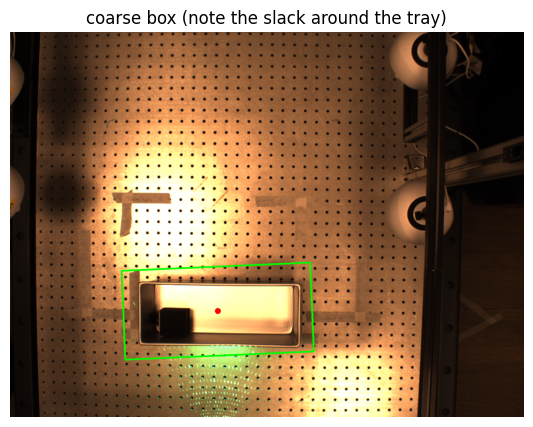

In [6]:
_BG_NORM_CACHE = {}

def find_box_coarse(bgr, bg=BG, work_w=WORK_W, pct=PCT, roi=ROI,
                    open_px=OPEN_PX, close_px=CLOSE_PX, return_stages=False):
    '''Coarse box via background subtraction. Returns dict(center, size, angle, corners)
    in FULL-RESOLUTION pixel coords, or None if no contour found.'''
    img_g, s = prep(bgr, work_w)
    img_n = illum_norm(img_g)
    key = (id(bg), work_w)                    # cache the normalized background
    if key not in _BG_NORM_CACHE:
        _BG_NORM_CACHE[key] = illum_norm(prep(bg, work_w)[0])
    dm = diff_map(img_n, _BG_NORM_CACHE[key])
    raw = threshold_roi(dm, roi, pct)
    m = clean_mask(raw, open_px, close_px)
    cnts, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    out = None
    if cnts:
        surf = max(cnts, key=cv2.contourArea)
        (cx, cy), (bw, bh), ang = cv2.minAreaRect(surf)
        inv = 1.0 / s
        rect = ((cx*inv, cy*inv), (bw*inv, bh*inv), ang)
        out = {"center": rect[0], "size": rect[1], "angle": ang,
               "corners": cv2.boxPoints(rect)}
    if return_stages:
        return out, {"diff": dm, "raw_mask": raw, "mask": m}
    return out

def plot_box(bgr, box, ax=None, title="", color=(0, 255, 0), thickness=6):
    vis = bgr.copy()
    if box is not None:
        cv2.drawContours(vis, [box["corners"].astype(np.int32)], 0, color, thickness)
        cv2.circle(vis, tuple(int(v) for v in box["center"]), 12, (0, 0, 255), -1)
    return show(vis, title, ax)

coarse = find_box_coarse(ref)
print("coarse center:", tuple(round(v) for v in coarse["center"]),
      "size:", tuple(round(v) for v in coarse["size"]))
plot_box(ref, coarse, title="coarse box (note the slack around the tray)");

## Stage 6 — edge-snap refinement: hug the real tray edges

The coarse rect is only a seed. To get tight edges we snap each of the 4 sides to the
tray's actual rim:

- rotate the image so the coarse box is axis-aligned, compute |Sobel| gradients on the
  **illumination-normalized** image (so the shadowed rim still has contrast),
- for each side, sum the gradient along the side direction in a search band
  (90 px inward / 15 px outward — the true edge is always inside the inflated coarse box),
- among all peaks ≥ 60% of the strongest, take the **outermost** one: that prefers the
  rim's outer edge over the (often stronger) inner bright-interior edge, and ignores
  tape/shadow edges outside.

`detect_box()` = coarse + refine, the one call to use everywhere.

detect_box: 41 ms/frame after cache warm-up
refined center: (838, 1130) size: (254, 645)


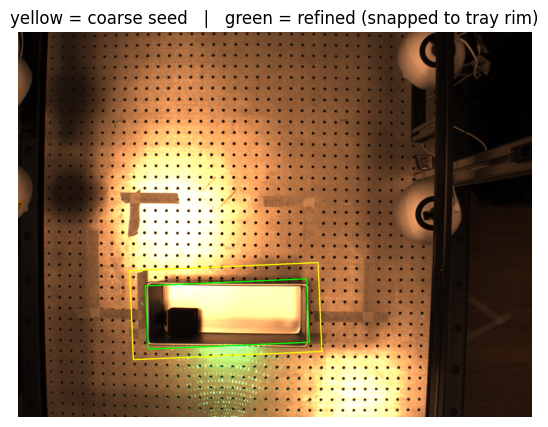

In [7]:
SEARCH_IN, SEARCH_OUT, PEAK_FRAC = 90, 15, 0.6

def refine_box(bgr, coarse, search_in=SEARCH_IN, search_out=SEARCH_OUT,
               peak_frac=PEAK_FRAC):
    '''Snap each side of the coarse box to the outermost strong gradient edge.
    Works on a crop around the coarse box (not the full frame) for speed.'''
    (cx, cy), (bw, bh), ang = coarse["center"], coarse["size"], coarse["angle"]
    a = ang % 90.0
    rot = a if a < 45 else a - 90.0          # fold so the long side is horizontal
    if bw < bh:
        bw, bh = bh, bw
    Hf, Wf = bgr.shape[:2]

    # crop around the coarse box: big enough for the search bands + rotation slack
    pad = int(search_in + 0.15 * bw)
    cx0, cy0 = max(int(cx - bw/2) - pad, 0), max(int(cy - bh/2) - pad, 0)
    cx1, cy1 = min(int(cx + bw/2) + pad, Wf), min(int(cy + bh/2) + pad, Hf)
    gray = cv2.cvtColor(bgr[cy0:cy1, cx0:cx1], cv2.COLOR_BGR2GRAY)
    ccx, ccy = cx - cx0, cy - cy0            # coarse center in crop coords

    M = cv2.getRotationMatrix2D((ccx, ccy), rot, 1.0)
    gn = illum_norm(gray, sigma=25) * 128.0
    gr = cv2.warpAffine(gn.astype(np.float32), M, (gray.shape[1], gray.shape[0]))
    gx = np.abs(cv2.Sobel(gr, cv2.CV_32F, 1, 0, ksize=3))
    gy = np.abs(cv2.Sobel(gr, cv2.CV_32F, 0, 1, ksize=3))
    x0, x1 = ccx - bw/2, ccx + bw/2
    y0, y1 = ccy - bh/2, ccy + bh/2
    H, W = gr.shape

    def snap(gimg, lo, hi, blo, bhi, axis, outer):
        lo, hi, blo, bhi = int(lo), int(hi), int(max(blo, 0)), int(bhi)
        lo = max(lo, 0); hi = min(hi, (W if axis == 'x' else H) - 1)
        prof = gimg[blo:bhi, lo:hi+1].sum(axis=0) if axis == 'x' else gimg[lo:hi+1, blo:bhi].sum(axis=1)
        idx = np.where(prof >= peak_frac * prof.max())[0]
        return lo + int(idx.min() if outer == 'min' else idx.max())

    # gradient bands shrunk 25% per side to keep corners out of the profile
    bx0, bx1 = x0 + 0.25*bw, x1 - 0.25*bw
    by0, by1 = y0 + 0.25*bh, y1 - 0.25*bh
    nx0 = snap(gx, x0-search_out, x0+search_in,  by0, by1, 'x', 'min')
    nx1 = snap(gx, x1-search_in,  x1+search_out, by0, by1, 'x', 'max')
    ny0 = snap(gy, y0-search_out, y0+search_in,  bx0, bx1, 'y', 'min')
    ny1 = snap(gy, y1-search_in,  y1+search_out, bx0, bx1, 'y', 'max')

    pts = np.array([[nx0, ny0], [nx1, ny0], [nx1, ny1], [nx0, ny1]], np.float32)
    Minv = cv2.invertAffineTransform(M)
    pts = cv2.transform(pts[None], Minv)[0] + np.float32([cx0, cy0])
    rect = cv2.minAreaRect(pts)
    return {"center": rect[0], "size": rect[1], "angle": rect[2],
            "corners": cv2.boxPoints(rect)}

def detect_box(bgr, **kw):
    '''THE detector: coarse background-subtraction box, then edge-snap refinement.'''
    c = find_box_coarse(bgr, **kw)
    if c is None:
        return None
    return refine_box(bgr, c)

import time
detect_box(ref)                                   # warm the background cache
t0 = time.time(); n = 10
for _ in range(n):
    ref_box = detect_box(ref)
print(f"detect_box: {(time.time()-t0)/n*1e3:.0f} ms/frame after cache warm-up")
print("refined center:", tuple(round(v) for v in ref_box["center"]),
      "size:", tuple(round(v) for v in ref_box["size"]))

vis = ref.copy()
cv2.drawContours(vis, [coarse["corners"].astype(np.int32)], 0, (0, 255, 255), 4)   # yellow = coarse
cv2.drawContours(vis, [ref_box["corners"].astype(np.int32)], 0, (0, 255, 0), 4)    # green  = refined
show(vis, "yellow = coarse seed   |   green = refined (snapped to tray rim)");

## Stage 7 — did it move, and which way to push it back?

Compare a new photo's box to the reference box:
- `dx, dy` = drift in pixels (image coords: +x right, +y down as you look at the overhead photo)
- instructions are the **opposite** direction — how to physically slide the box back
- rotation is compared too (`minAreaRect` angles folded into [-45°, 45°) since a rectangle
  is 90°-symmetric — this also absorbs OpenCV's width/height axis swap)

In [8]:
def _norm_angle(a):
    a = a % 90.0
    return a - 90.0 if a >= 45.0 else a

def same_position(ref_box, new_bgr, tol_px=15, tol_deg=3.0, **kw):
    '''Is the box in new_bgr where ref_box says it should be?'''
    new_box = detect_box(new_bgr, **kw)
    if new_box is None:
        return {"in_place": False, "instructions": ["box not found"], "new_box": None,
                "dx": None, "dy": None, "distance": None, "d_angle": None}
    dx = new_box["center"][0] - ref_box["center"][0]
    dy = new_box["center"][1] - ref_box["center"][1]
    dist = float(np.hypot(dx, dy))
    d_ang = _norm_angle(new_box["angle"] - ref_box["angle"])
    moved, rotated = dist > tol_px, abs(d_ang) > tol_deg
    instr = []
    if moved:
        if abs(dx) > tol_px / 2:
            instr.append(f"slide {'LEFT' if dx > 0 else 'RIGHT'} {abs(dx):.0f}px")
        if abs(dy) > tol_px / 2:
            instr.append(f"slide {'UP' if dy > 0 else 'DOWN'} {abs(dy):.0f}px")
    if rotated:
        instr.append(f"rotate {'CCW' if d_ang > 0 else 'CW'} {abs(d_ang):.1f} deg")
    if not instr:
        instr = ["in place - no adjustment needed"]
    return {"in_place": not (moved or rotated), "dx": dx, "dy": dy, "distance": dist,
            "d_angle": d_ang, "instructions": instr, "new_box": new_box}

res = same_position(ref_box, ref)
print("reference vs itself:", res["in_place"], "|", res["instructions"])

reference vs itself: True | ['in place - no adjustment needed']


## Validation A — 16 samples across the dataset

The tray is physically fixed in the dataset, so every sample should read **in place** with
near-identical refined boxes, regardless of where the black cube sits. (Refined tolerance
can be much tighter than the coarse one: 15 px instead of 30.)

refined center std (px): [2.18 1.2 ] | max spread: [7.9 4.1]


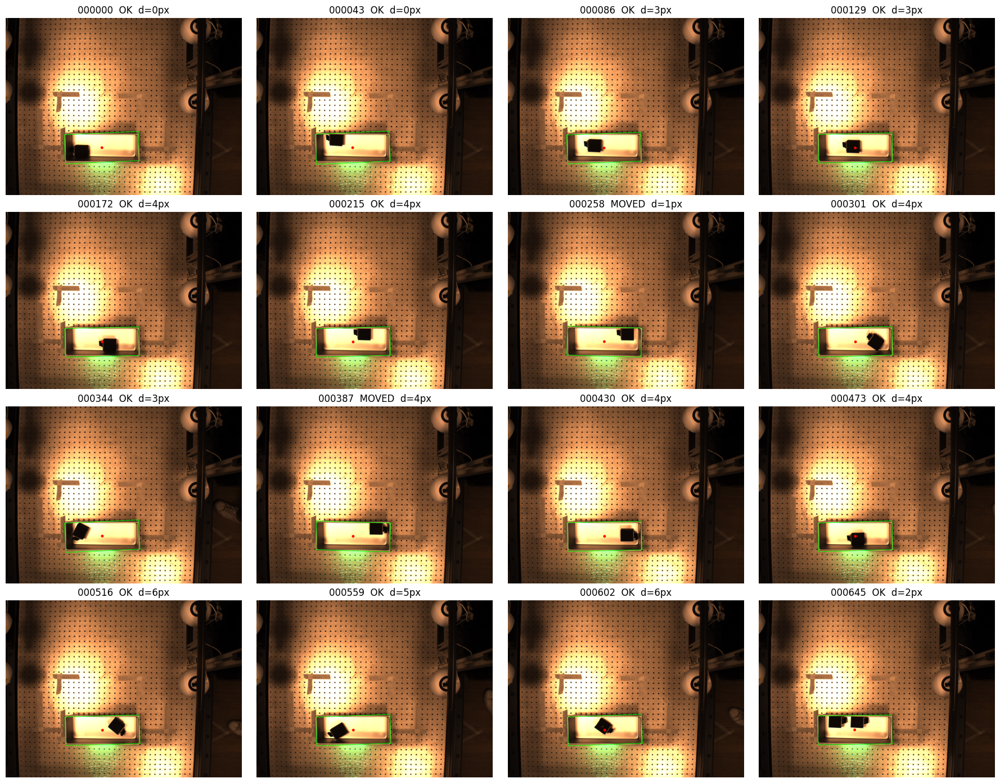

In [9]:
ids = ["%06d" % i for i in range(0, 688, 43)]
fig, axes = plt.subplots(4, 4, figsize=(18, 14))
centers = []
for ax, sid in zip(axes.ravel(), ids):
    img = load_bgr(rf"{SAMPLES}\{sid}\outputs\00_raw_overhead.png")
    r = same_position(ref_box, img)
    centers.append(r["new_box"]["center"])
    plot_box(img, r["new_box"], ax=ax, thickness=4,
             title=f"{sid}  {'OK' if r['in_place'] else 'MOVED'}  d={r['distance']:.0f}px")
plt.tight_layout()

c = np.array(centers)
print("refined center std (px):", c.std(0).round(2), "| max spread:", (c.max(0)-c.min(0)).round(1))

## Validation B — synthetic "someone knocked the table"

The dataset has no real moved-box photos, so we fabricate them **properly**: cut out just
the tray patch, fill the vacated area with a brightness-matched patch of the empty-table
photo, and paste the tray somewhere else. (Warping the whole image would misalign every
pegboard dot with the background and simulate a moved *camera*, not a moved box.)

**Caveat:** the paste seams of the synthetic image leave a little diff residue at the old location, so *large* synthetic moves read direction-correct but magnitude-low (e.g. true 120 px right → “slide LEFT 40px”). A realistic small nudge is measured almost exactly (true 20 px → 19 px), and a real knock won't have this artifact at all: the vacated spot is genuine pegboard that matches the background. Since the direction is always right, following the instruction and re-checking converges in a step or two.

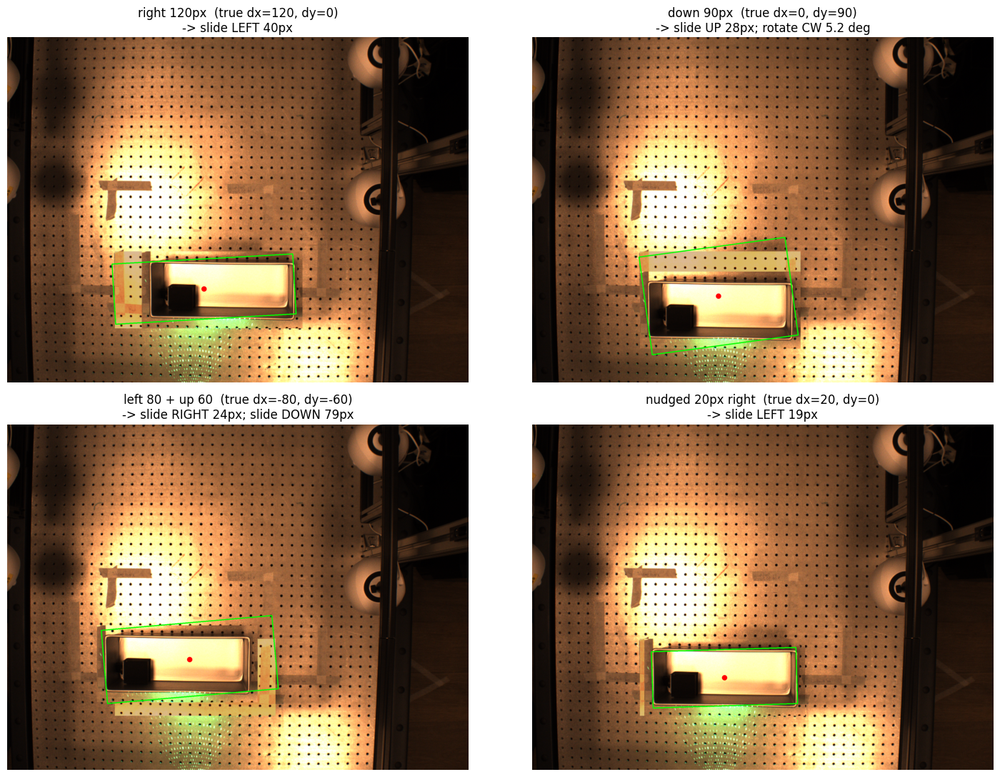

In [10]:
def move_box(ref_img, box, dx, dy, deg=0, margin=30):
    '''Synthetically move the box by (dx, dy) px and rotate by deg.'''
    x, y, w, h = cv2.boundingRect(box["corners"].astype(np.int32))
    x -= margin; y -= margin; w += 2*margin; h += 2*margin
    out = ref_img.copy()
    patch = ref_img[y:y+h, x:x+w].copy()
    # fill the vacated area with brightness-matched empty-table content
    band_ref = ref_img[y-80:y, x:x+w].astype(np.float32).mean(axis=(0, 1))
    band_bg  = BG[y-80:y, x:x+w].astype(np.float32).mean(axis=(0, 1))
    fill = np.clip(BG[y:y+h, x:x+w].astype(np.float32) * (band_ref / (band_bg + 1e-6)),
                   0, 255).astype(np.uint8)
    out[y:y+h, x:x+w] = fill
    if deg:
        Mr = cv2.getRotationMatrix2D((w/2, h/2), deg, 1.0)
        patch = cv2.warpAffine(patch, Mr, (w, h), borderMode=cv2.BORDER_REPLICATE)
    out[y+dy:y+dy+h, x+dx:x+dx+w] = patch
    return out

cases = [("right 120px",       120,   0, 0),
         ("down 90px",           0,  90, 0),
         ("left 80 + up 60",   -80, -60, 0),
         ("nudged 20px right",  20,   0, 0)]

fig, axes = plt.subplots(2, 2, figsize=(15, 11))
for ax, (name, dx, dy, deg) in zip(axes.ravel(), cases):
    moved = move_box(ref, ref_box, dx, dy, deg)
    r = same_position(ref_box, moved)
    plot_box(moved, r["new_box"], ax=ax, thickness=4,
             title=f"{name}  (true dx={dx}, dy={dy})\n-> {'; '.join(r['instructions'])}")
plt.tight_layout()

## End-goal wrapper

One call: reference photo + new photo in, verdict + instructions out.

In [11]:
def is_box_in_place(ref_path, new_path, tol_px=15, tol_deg=3.0):
    ref_img, new_img = load_bgr(ref_path), load_bgr(new_path)
    rb = detect_box(ref_img)
    res = same_position(rb, new_img, tol_px=tol_px, tol_deg=tol_deg)
    print("OK - box in place" if res["in_place"] else "MOVED -> " + "; ".join(res["instructions"]))
    return res

_ = is_box_in_place(REF_PATH, rf"{SAMPLES}\000024\outputs\00_raw_overhead.png")

OK - box in place


## Experiment — morphological cleanup bake-off

Four cleanup strategies for Stage 4, run on the same thresholded mask. Inspect the masks,
the resulting boxes on the three trickiest samples, and the stability table, then pick a
winner in the `CHOICE` cell below.

| variant | recipe | idea |
|---|---|---|
| `current` | OPEN ellipse 5 + CLOSE ellipse 41 | baseline |
| `rect-close` | OPEN ellipse 5 + CLOSE **rect 81×41** | kernel shaped like the wide tray merges the rim with less vertical bloat |
| `close-open` | CLOSE 41 **then** OPEN 15 | merge first, then shave off tendrils/shadow tails the merge created |
| `hull-merge` | OPEN 5 + CLOSE 15, then **convex hull** of all significant blobs | tiny CLOSE = minimal bloat; the hull does the merging geometrically |

(The bake-off scores the **coarse** stage on its own and also the final **refined** box each
seed produces — refinement can rescue a mediocre seed, so both matter.)

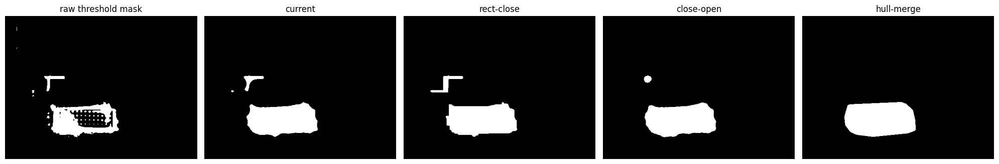

In [12]:
def _morph(mask, op, ksize, shape=cv2.MORPH_ELLIPSE):
    return cv2.morphologyEx(mask, op, cv2.getStructuringElement(shape, ksize))

def clean_current(mask, *a, **k):
    return _morph(_morph(mask, cv2.MORPH_OPEN, (5, 5)), cv2.MORPH_CLOSE, (41, 41))

def clean_rect_close(mask, *a, **k):
    m = _morph(mask, cv2.MORPH_OPEN, (5, 5))
    return _morph(m, cv2.MORPH_CLOSE, (81, 41), cv2.MORPH_RECT)   # wide like the tray

def clean_close_open(mask, *a, **k):
    m = _morph(mask, cv2.MORPH_CLOSE, (41, 41))
    return _morph(m, cv2.MORPH_OPEN, (15, 15))

def clean_hull_merge(mask, *a, **k):
    m = _morph(_morph(mask, cv2.MORPH_OPEN, (5, 5)), cv2.MORPH_CLOSE, (15, 15))
    cnts, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return m
    biggest = max(cv2.contourArea(c) for c in cnts)
    keep = [c for c in cnts if cv2.contourArea(c) >= 0.15 * biggest]
    hull = cv2.convexHull(np.vstack([c.reshape(-1, 2) for c in keep]))
    out = np.zeros_like(m)
    cv2.fillPoly(out, [hull], 255)
    return out

VARIANTS = {"current": clean_current, "rect-close": clean_rect_close,
            "close-open": clean_close_open, "hull-merge": clean_hull_merge}

# masks side by side on the reference sample
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
show(raw_mask, "raw threshold mask", axes[0])
for ax, (name, fn) in zip(axes[1:], VARIANTS.items()):
    show(fn(raw_mask.copy()), name, ax)
plt.tight_layout()

In [13]:
ids16 = ["%06d" % i for i in range(0, 688, 43)]
imgs16 = {sid: load_bgr(rf"{SAMPLES}\{sid}\outputs\00_raw_overhead.png") for sid in ids16}

_baseline_clean = clean_mask          # so we can restore afterwards
stats = {}
for name, fn in VARIANTS.items():
    clean_mask = fn                   # find_box_coarse picks this up (module global)
    cc, fc = [], []
    for img in imgs16.values():
        c = find_box_coarse(img)
        if c is None:
            continue
        cc.append(c["center"])
        fc.append(refine_box(img, c)["center"])
    cc, fc = np.array(cc), np.array(fc)
    stats[name] = (len(cc), cc.std(0), fc.std(0))
clean_mask = _baseline_clean

print(f"{'variant':12s} {'found':>5s}   {'coarse center std':>22s}   {'refined center std':>22s}")
for name, (n, cs, fs) in stats.items():
    print(f"{name:12s} {n:3d}/16   ({cs[0]:6.2f}, {cs[1]:6.2f}) px      ({fs[0]:6.2f}, {fs[1]:6.2f}) px")
print("\nlower std = more repeatable (the tray never actually moves in these samples)")

variant      found        coarse center std       refined center std
current       16/16   (  8.04,   6.45) px      (  2.18,   1.20) px
rect-close    16/16   ( 29.42,  17.30) px      ( 31.57,  23.10) px
close-open    16/16   (  5.17,   8.02) px      (  2.25,   1.74) px
hull-merge    16/16   (  7.90,   6.72) px      (  2.21,   1.23) px

lower std = more repeatable (the tray never actually moves in these samples)


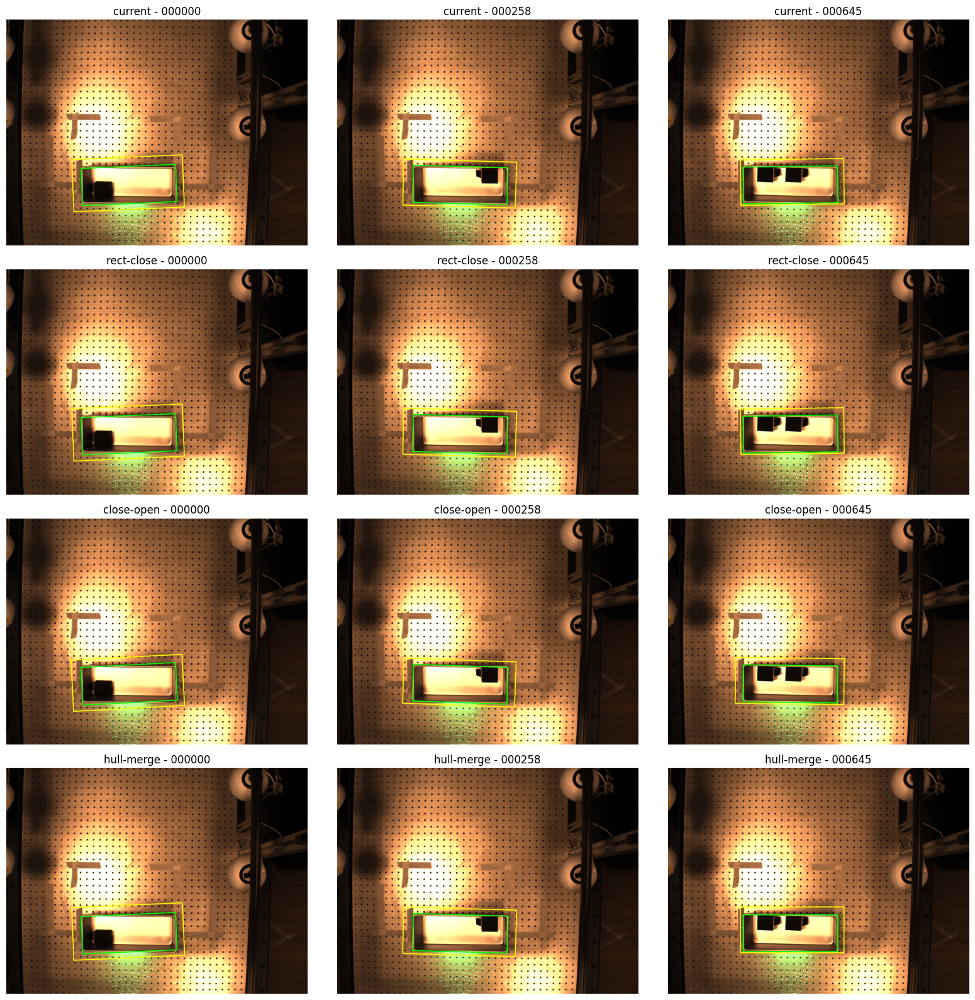

In [14]:
tricky = ["000000", "000258", "000645"]
fig, axes = plt.subplots(len(VARIANTS), len(tricky), figsize=(16, 16))
for r, (name, fn) in enumerate(VARIANTS.items()):
    clean_mask = fn
    for cidx, sid in enumerate(tricky):
        img = imgs16[sid]
        co = find_box_coarse(img)
        fi = refine_box(img, co) if co else None
        ax = axes[r, cidx]
        vis = img.copy()
        if co is not None:
            cv2.drawContours(vis, [co["corners"].astype(np.int32)], 0, (0, 255, 255), 6)
        if fi is not None:
            cv2.drawContours(vis, [fi["corners"].astype(np.int32)], 0, (0, 255, 0), 6)
        show(vis, f"{name} - {sid}", ax)
clean_mask = _baseline_clean
plt.tight_layout()

### Pick the winner

Set `CHOICE` to the variant you like best — everything downstream (`detect_box`,
`same_position`, the live feed) will use it from then on. Re-run Validation A/B after
changing it if you want the numbers refreshed.

In [15]:
CHOICE = "current"          # <- change to "rect-close" / "close-open" / "hull-merge"

clean_mask = VARIANTS[CHOICE]
print(f"clean_mask is now '{CHOICE}'")

clean_mask is now 'current'


## Live feed — draw the detection on the overhead camera preview

Same IDS/pyueye camera pattern as `27_record.ipynb` (that notebook is not touched — the
few lines of setup are reproduced here). The preview loop runs the detector every few
frames and draws:

- **green box** = current detected position (red if it drifted out of tolerance)
- **black box** = reference position it should return to
- verdict + slide instructions as text, with an arrow showing the push direction

**Keys:** `r` = re-capture the reference from the current frame (put the box in its
correct spot first) · `Enter` = quit.

Set `RUN_LIVE = True` on the lab machine (needs the camera + `pyueye`); it's `False` here
so the notebook can execute without hardware.

**Stability:** a deadband ignores detection changes under `jitter_px`/`jitter_deg` (so the outline doesn't flicker at rest), and any detection whose side lengths don't match the reference box within `size_tol` (18%) is rejected as an occlusion — e.g. your hand reaching in. The feed then shows an orange **OCCLUDED** banner and holds the last good box until the hand leaves.

In [17]:
RUN_LIVE = True   # <- set True on the machine with the overhead camera

def setup_overhead_camera(exposure_ms=15, frame_rate=30, pixel_clock=86, gain=60):
    '''Init the IDS overhead camera (same parameters as 27_record.ipynb).'''
    import sys
    from pathlib import Path
    parent = Path.cwd().parent
    if str(parent) not in sys.path:
        sys.path.insert(0, str(parent))
    from pyueye import ueye
    from utils.ids_camera.pyueye_example_camera import Camera as PyueyeCamera

    # release a handle left over from a previous run of THIS notebook
    global overhead_cam
    if 'overhead_cam' in globals():
        try:
            overhead_cam.exit()
            print("closed existing camera handle from this notebook")
        except Exception:
            pass

    cam = PyueyeCamera(device_id=0)
    try:
        cam.init()
    except Exception as e:
        if '213' in str(e):
            raise RuntimeError(
                "Camera is IS_DEVICE_IN_USE (err 213): another process holds it. "
                "Close the 27_record.ipynb kernel (or run overhead_cam.exit() there), "
                "and close uEye Cockpit if open, then re-run this cell.") from e
        raise
    cam.set_colormode(ueye.IS_CM_SENSOR_RAW8)
    cam.alloc(buffer_count=3)   # small queue: old frames can't pile up -> low lag
    cam.set_pixel_clock(pixel_clock)
    cam.set_exposure(exposure_ms)
    cam.set_gain(gain)
    cam.set_frame_rate(frame_rate)
    return cam

def _plausible_box(box, ref_box, size_tol=0.18):
    '''Reject detections that aren't box-shaped (e.g. a hand merged into the blob):
    both side lengths must match the reference box within size_tol.'''
    if box is None or ref_box is None:
        return False
    s, r = sorted(box["size"]), sorted(ref_box["size"])
    return all(abs(a - b) / max(b, 1.0) < size_tol for a, b in zip(s, r))

def live_box_feed(cam, ref_box=None, resize_factor=0.75, gamma=1.4,
                  detect_every=2, tol_px=15, tol_deg=3.0,
                  jitter_px=8.0, jitter_deg=1.5, size_tol=0.18):
    '''Live overhead preview with the box detection drawn on top.

    ref_box: reference position (e.g. detect_box(load_bgr(REF_PATH))).
             If None, the first detection becomes the reference.
    '''
    from utils.image_processing import adjustGamma
    cam.disable_external_trigger()
    cam.capture_video()
    cv2.namedWindow("box position - live")
    i, res, misses, occluded = 0, None, 0, False
    import time as _time
    t_prev, fps = _time.time(), 0.0
    try:
        while True:
            out = cam.read_frame()          # returns None on a 1s timeout - just retry
            if out is None:
                misses += 1
                if misses >= 10:
                    raise RuntimeError("no frame from camera for ~10s - is it still connected?")
                continue
            misses = 0
            raw, _ = out
            frame = cv2.cvtColor(raw.astype('uint8'), cv2.COLOR_BAYER_BG2BGR)
            frame = cv2.rotate(frame, cv2.ROTATE_180)

            if i % detect_every == 0:
                try:
                    if ref_box is None:
                        ref_box = detect_box(frame)
                    cand = same_position(ref_box, frame, tol_px=tol_px, tol_deg=tol_deg)
                    if not _plausible_box(cand["new_box"], ref_box, size_tol):
                        occluded = True          # hand/occlusion: hold the last good box
                    else:
                        occluded = False
                        # deadband: ignore sub-jitter changes so the outline can't flicker
                        if res and res.get("new_box") is not None:
                            oc, nc = res["new_box"]["center"], cand["new_box"]["center"]
                            jump = np.hypot(nc[0]-oc[0], nc[1]-oc[1])
                            d_ang = abs(_norm_angle(cand["new_box"]["angle"] - res["new_box"]["angle"]))
                            if jump > jitter_px or d_ang > jitter_deg:
                                res = cand
                        else:
                            res = cand
                except Exception as e:       # a bad frame must not kill the feed
                    print("detection hiccup:", e)
            i += 1

            vis = frame
            if ref_box is not None:                          # black = where it should be
                cv2.drawContours(vis, [ref_box["corners"].astype(np.int32)], 0,
                                 (0, 0, 0), 5)
            if occluded:
                cv2.putText(vis, "OCCLUDED - holding last box", (30, 120),
                            cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0, 165, 255), 3)
            if res and res["new_box"] is not None:
                ok = res["in_place"]
                color = (0, 255, 0) if ok else (0, 0, 255)   # green ok, red moved
                nb_ = res["new_box"]
                cv2.drawContours(vis, [nb_["corners"].astype(np.int32)], 0, color, 4)
                txt = "IN PLACE" if ok else " | ".join(res["instructions"])
                cv2.putText(vis, txt, (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.6, color, 4)
                if not ok and res["dx"] is not None:         # arrow = push direction
                    c = tuple(int(v) for v in nb_["center"])
                    tip = (int(c[0] - res["dx"]), int(c[1] - res["dy"]))
                    cv2.arrowedLine(vis, c, tip, (0, 200, 255), 5, tipLength=0.25)
            t_now = _time.time()
            fps = 0.9 * fps + 0.1 / max(t_now - t_prev, 1e-6)
            t_prev = t_now
            cv2.putText(vis, f"r = set reference   Enter = quit   {fps:.0f} fps",
                        (30, vis.shape[0] - 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0,
                        (255, 255, 255), 2)

            if gamma != 1.0:
                vis = adjustGamma(vis, gamma=gamma)
            if resize_factor != 1:
                vis = cv2.resize(vis, None, fx=resize_factor, fy=resize_factor)
            cv2.imshow("box position - live", vis)

            key = cv2.waitKey(1)
            if key == 13:                                    # Enter
                break
            if key == ord('r'):                              # new reference from live frame
                ref_box = detect_box(frame)
    finally:
        cv2.destroyAllWindows()
        cam.stop_video()
    return ref_box

if RUN_LIVE:
    overhead_cam = setup_overhead_camera()
    # reference from the dataset photo; press 'r' in the window to re-take it live
    live_box_feed(overhead_cam, ref_box=detect_box(load_bgr(REF_PATH)))
else:
    print("RUN_LIVE is False - flip it to True on the lab machine to start the live feed.")

closed existing camera handle from this notebook
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed
failed